In [1]:

import numpy as np
import os
import os.path as osp
import sys
import torch
path = osp.abspath(osp.join(os.getcwd(), "..", ".."))
sys.path.append(path)
print(f"PythonPath added : {path}")
from src import get_dataset
import matplotlib.pyplot as plt
from IPython.display import Audio, display




PythonPath added : /home/antoine/Bureau/3A/time_series/Dictionary-Learning


In [2]:

Ys, sampling_rates, files = get_dataset("instruments")

def to_mono(s):
    if len(s.shape) == 2:  # Stereo signal
        return np.mean(s, axis=1)  # Average the two channels to get mono
    return s

signals = list(map(to_mono, Ys))

In [3]:
print(np.unique(np.array(sampling_rates)))

[16000 24000 44100 48000]


We will resample to have a fixed sampling rate for our training dataset.

In [4]:
from scipy.signal import resample

target_rate = 24000

resampled_signals = []

for i, (signal, rate) in enumerate(zip(signals, sampling_rates)):

    num_samples = int(len(signal) * target_rate / rate)  # Target number of samples
    resampled_signal = resample(signal, num_samples)  # Resample using FFT

    # Append the resampled signal
    resampled_signals.append(resampled_signal)


In [5]:
idx = np.random.randint(0, len(Ys))
signal = signals[idx]
resampled_signal = resampled_signals[idx]
rate = sampling_rates[idx]
display(Audio(signal, rate=rate))
display(Audio(resampled_signal, rate=target_rate))

We can now generate our frames to learn our dictionary

### Config

In [6]:
length_frame_ms = 50
length_delta_frame_ms = 20

In [7]:
def generate_frames(signal, time_length_ms, frame_delta_ms):
    nb_samples = signal.shape[0]
    time_length_s = time_length_ms/1000
    frame_nb_samples = int(target_rate * time_length_s)
    frame_delta_samples = int(target_rate * frame_delta_ms/1000)
    frames = []
    for k in range(0,nb_samples -frame_nb_samples, frame_delta_samples):
        frames.append(signal[k:k+frame_nb_samples])
    return np.array(frames), frame_delta_samples


frames = np.concatenate(list(map(lambda x : generate_frames(x, length_frame_ms, length_delta_frame_ms)[0], resampled_signals)), axis=0)

def preprocessing(X):
    means = X.mean(axis=1)
    std = X.std(axis=1)
    infos = {"means" : means, "std" : std}
    return (X - means[:,np.newaxis]) / std[:,np.newaxis], infos

def postprocessing(X, infos):
    means = infos["means"]
    std = infos["std"]
    return X * std[:,np.newaxis] + means[:,np.newaxis] 

x_train, infos = preprocessing(frames)
print("number of data", len(x_train))
print("dimension of frames", x_train.shape[1])

number of data 298097
dimension of frames 1200


In [14]:
m = x_train.shape[1]
nb_atoms = 30

def sklearn_dico():
    from sklearn.decomposition import MiniBatchDictionaryLearning
    dict_learner = MiniBatchDictionaryLearning(n_components=500, batch_size=64, transform_algorithm='lasso_lars', transform_alpha=0.15, max_iter=1, random_state=42, verbose=True, max_no_improvement=10, tol=1e-1)
    dict_learner.fit(x_train)
    return dict_learner

from src.dictionary.dictionary_algo import DictionaryAlgoParallel
def own_implem_dico():


    dict_learner = DictionaryAlgoParallel(m=m, k=nb_atoms, lbd=1e-3, dic_update_steps=2, use_cuda=False, dico_update="quick_update", n_jobs=-1, verbose=True)
    dict_learner.D = torch.tensor(torch.from_numpy(x_train[:nb_atoms].T), dtype=torch.float)
    dict_learner.D.to(dict_learner.device)
    
    from tqdm import tqdm
    from itertools import cycle
    class FiniteGenerator:
        def __init__(self, iterable, nb_elt,  batch_size = 8):
            self.iterable = iterable
            self.nb_elt = nb_elt
            self.batch_size = batch_size
        def __len__(self):
            return self.nb_elt
        def __iter__(self,):
            infinite_loader = cycle(self.iterable)          
            for k in tqdm(range(self.nb_elt // self.batch_size)):
                data = np.array([next(infinite_loader) for _ in range(self.batch_size)])
                yield torch.from_numpy(data).float()
                
                
    dict_learner.fit(FiniteGenerator(x_train, 100000,batch_size=128))
    return dict_learner

dict_learner = own_implem_dico()
#= DictionaryAlgoParallel(m=m, k=nb_atoms, lbd=1e-3, dic_update_steps=2, use_cuda=False, dico_update="quick_update", n_jobs=-1, verbose=True)
dict_learner.save("./audio_dict_24k2.npy")


100%|██████████| 781/781 [01:43<00:00,  7.58it/s]


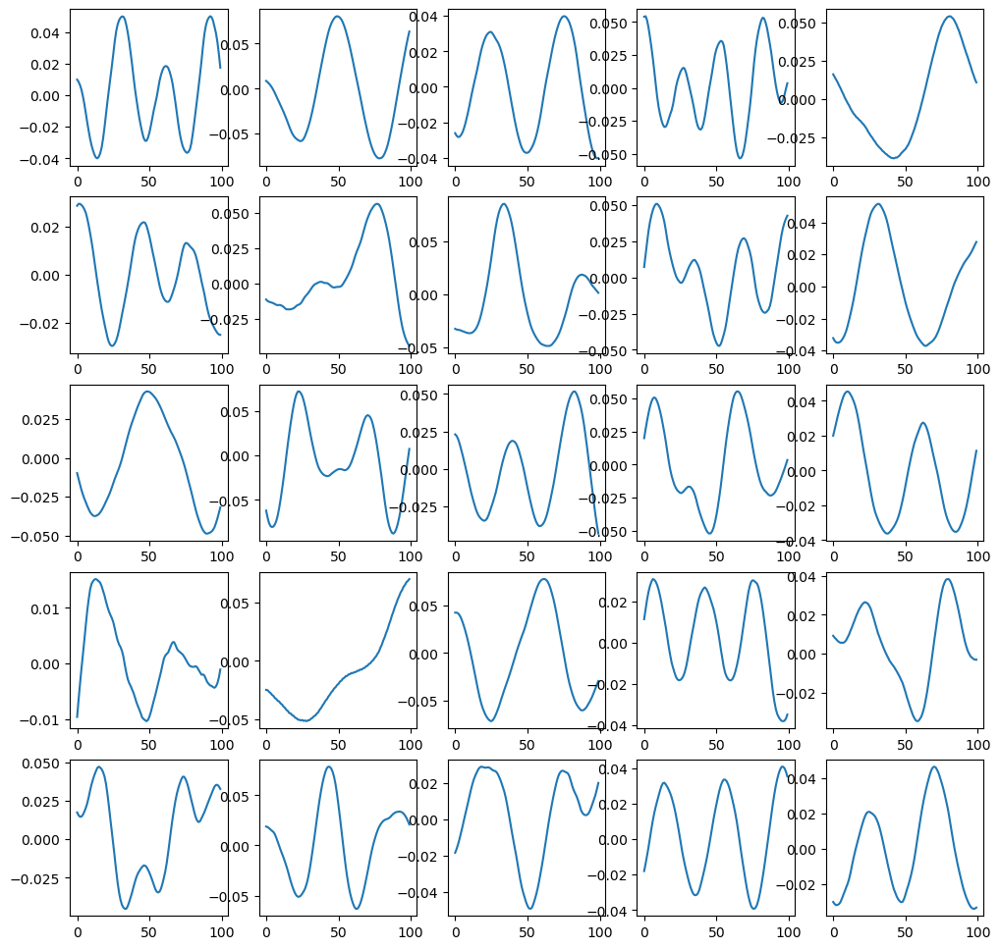

In [20]:
def plot_square(data, n_rows):
    n_cols = n_rows 

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 12))
    axes = axes.flatten()  # Flatten axes for easy indexing
    for k, ax in enumerate(axes):
        ax.plot(data[k])
        
atoms = dict_learner.components_
plot_square(atoms[:,:100], 5)

In [10]:
idx = np.random.randint(0, len(Ys))
signal = resampled_signals[idx]
rate = sampling_rates[idx]

In [11]:

def make_prediction(X, dict_learner):
    X, infos = preprocessing(X)
    weights_encoded = dict_learner.transform(X, n_nonzero_coefs=30)
    print(weights_encoded.shape, dict_learner.components_.shape)
    x_transformed = weights_encoded @ dict_learner.components_
    x_transformed = postprocessing(x_transformed, infos)
    return x_transformed


def fuze_patches_predictions(patches, delta_samples):
    patch_size = patches.shape[1]
    audio_reconstructed = np.zeros(len(patches) * delta_samples+ patch_size - delta_samples)
    number_writtings = np.zeros(len(patches) * delta_samples+ patch_size - delta_samples)
    
    for k in range(len(patches)):
        audio_reconstructed[k*delta_samples:k*delta_samples + patch_size] += patches[k]
        number_writtings[k*delta_samples:k*delta_samples + patch_size] += 1
    
    audio_reconstructed = audio_reconstructed / number_writtings
    print(len(audio_reconstructed))
    return audio_reconstructed




delta_patch_reconstruction = 50
signal_patches, frame_delta_samples = generate_frames(signal, length_frame_ms, delta_patch_reconstruction)
signal_patches_encoded = make_prediction(signal_patches, dict_learner)
signal_reconstructed = fuze_patches_predictions(signal_patches_encoded,frame_delta_samples )
display(Audio(signal, rate=target_rate))
display(Audio(signal_reconstructed, rate=target_rate))

(841, 500) (500, 1200)
1009200


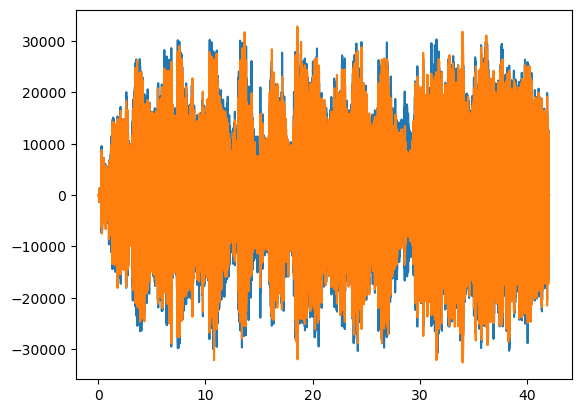

In [12]:
import matplotlib.pyplot as plt
plt.plot(np.arange(len(signal)) / target_rate, signal)
plt.plot(np.arange(len(signal_reconstructed)) / target_rate, signal_reconstructed)

In [13]:
noised_signal = signal + np.random.normal(0, 0.1*signal.std(), size=len(signal))


delta_patch_reconstruction = 50
signal_patches, frame_delta_samples = generate_frames(noised_signal, length_frame_ms, delta_patch_reconstruction)
signal_patches_encoded = make_prediction(signal_patches, dict_learner)
signal_reconstructed_noise = fuze_patches_predictions(signal_patches_encoded,frame_delta_samples )


display(Audio(signal, rate=target_rate))
display(Audio(noised_signal, rate=target_rate))
display(Audio(signal_reconstructed_noise, rate=target_rate))

KeyboardInterrupt: 

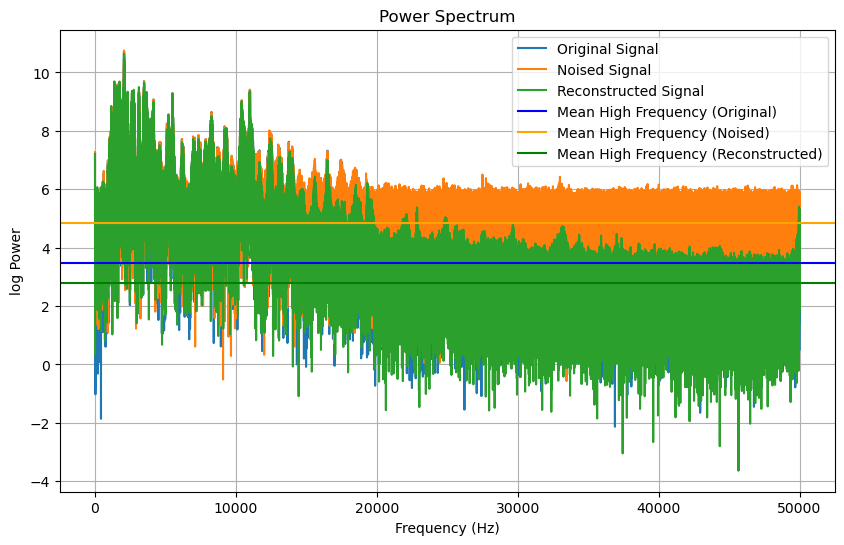

In [32]:
from scipy.io.wavfile import write

def save_audio(signal, path):

    # If the signal is in floating point format, scale it to a valid integer range
    # For 16-bit PCM audio, the range is from -32768 to 32767
    scaled_signal = np.int16(signal / np.max(np.abs(signal)) * 32767)
    
    # Save the signal as a .wav file
    write(path, target_rate, scaled_signal)
    
save_audio(signal, "original.wav")
save_audio(noised_signal, "noised.wav")
save_audio(signal_reconstructed_noise, "denoised.wav")
save_audio(signal_reconstructed, "reconstructed.wav")
def power_spectrum(signal, fs):
    fft_signal = np.fft.fft(signal)
    n = len(signal)
    power_spectrum = np.abs(fft_signal)**2 / n
    frequencies = np.fft.fftfreq(n, 1/fs)
    return frequencies[:n//2], power_spectrum[:n//2]


def plot_power_spectra(signal, noised_signal, signal_reconstructed, fs):
    f_signal, ps_signal = power_spectrum(signal, fs)
    f_noised, ps_noised = power_spectrum(noised_signal, fs)
    f_reconstructed, ps_reconstructed = power_spectrum(signal_reconstructed, fs)

    log_ps_signal = np.log10(ps_signal)
    log_ps_noised = np.log10(ps_noised)
    log_ps_reconstructed = np.log10(ps_reconstructed)
    mean_high_freq_signal = np.mean(log_ps_signal[len(log_ps_signal)//2:])
    mean_high_freq_noised = np.mean(log_ps_noised[len(log_ps_noised)//2:])
    mean_high_freq_reconstructed = np.mean(log_ps_reconstructed[len(log_ps_reconstructed)//2:])

    plt.figure(figsize=(10, 6))
    
    
    
    
    
    plt.plot(f_signal, log_ps_signal, label='Original Signal')
    plt.plot(f_noised, log_ps_noised, label='Noised Signal')
    plt.plot(f_reconstructed, log_ps_reconstructed, label='Reconstructed Signal')
    
    plt.axhline(y=mean_high_freq_signal, color='blue', label=f'Mean High Frequency (Original)')
    plt.axhline(y=mean_high_freq_noised, color='orange', label=f'Mean High Frequency (Noised)')
    plt.axhline(y=mean_high_freq_reconstructed, color='green', label=f'Mean High Frequency (Reconstructed)')
    
    plt.title('Power Spectrum')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('log Power')
    plt.legend()
    plt.grid(True)
    plt.show()

fs = 100000
plot_power_spectra(signal, noised_signal, signal_reconstructed, fs)

In [33]:



np.save("audio_dict_24k.npy", dict_learner.components_)

In [34]:
path = "Alderiate vs Doran - 1v1 Red Bull League of Its Own 2024.mp3"
import librosa

audio, sr = librosa.load(path, sr=target_rate)

In [35]:
audio = audio[:len(audio) // 10]

In [36]:
delta_patch_reconstruction = 20
signal_patches, frame_delta_samples = generate_frames(audio, length_frame_ms, delta_patch_reconstruction)
signal_patches_encoded = make_prediction(signal_patches, dict_learner)
signal_reconstructed = fuze_patches_predictions(signal_patches_encoded,frame_delta_samples )
display(Audio(audio, rate=target_rate))
display(Audio(signal_reconstructed, rate=target_rate))

(1517, 500) (500, 1200)
728880


In [37]:
save_audio(signal_reconstructed, "reconstructed_lol.wav")